In [1]:
import numpy as np
import numpy.random as nr
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
mpl.style.use('ggplot')
mpl.rcParams['figure.figsize'] = (9,5)
mpl.rcParams['figure.dpi']=100

In [11]:
num_pts = 1000
nr.seed(42)
xs = nr.random((num_pts,))
noise_level =0.3
es = nr.randn(num_pts)*noise_level
m = 2.71828
b = 3.14159
ys = m*xs + b +es

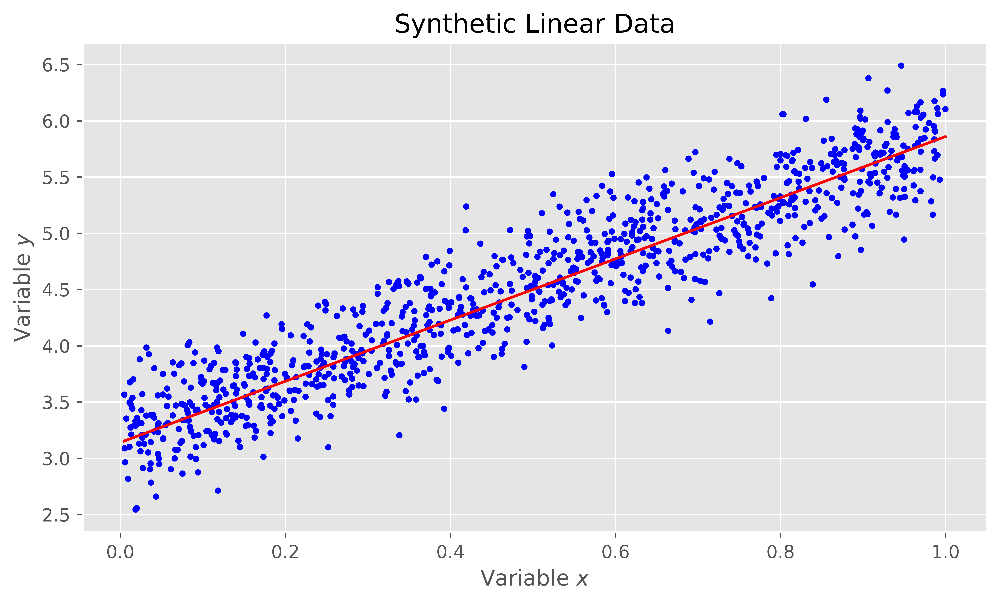

In [12]:
fig, ax = plt.subplots()
ax.scatter(xs,ys, color = 'b',marker='.')
ax.plot([xs.min(),xs.max()],[m*xs.min()+b, m*xs.max()+b],'r-')
ax.set_xlabel('Variable $x$')
ax.set_ylabel('Variable $y$')
ax.set_title('Synthetic Linear Data')

In [13]:
X = np.vstack([xs,np.ones(len(xs))]).T
X.shape

(1000, 2)

In [14]:
Y = ys.reshape((len(ys),1))
Y.reshape

<function ndarray.reshape>

In [15]:
Chat = np.dot(np.linalg.inv(np.dot(X.T,X)),np.dot(X.T,Y))

In [16]:
print('m-',Chat[0],'b=',Chat[1])

m- [ 2.67184445] b= [ 3.19402408]


In [62]:
yshat = np.dot(X,Chat)
yshat.shape

(1000, 1)

In [60]:
rmse = np.sqrt(((Y-yshat)**2).sum()*(1/num_pts))
rmse

0.29622138572383866

In [61]:
(Y-yshat).mean()

-2.2071233729548112e-16

Numpy Lin Regression

In [36]:
m_numpy,b_numpy = np.linalg.lstsq(X,Y)[0]
print("m={}, b={}".format(m_numpy,b_numpy))

m=[ 2.67184445], b=[ 3.19402408]


In [27]:
from sklearn.linear_model import LinearRegression
reg = LinearRegression()
reg.fit(xs.reshape(len(xs),1),ys)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [29]:
print("m={}, b={}".format(reg.coef_[0],reg.intercept_))

m=2.6718444510833965, b=3.1940240775479305


In [37]:
yhat_sk = reg.predict(xs.reshape(len(xs),1))
rmse = np.sqrt(((Y-yhat_sk.reshape(Y.shape))**2).sum()*(1/num_pts))

In [38]:
rmse

0.29622138572383866

In [40]:
reg.score(xs.reshape(len(xs),1),ys)

0.8739970408988923

In [97]:
import statsmodels.api as sm
model = sm.OLS(ys,X)
results = model.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.874
Model:                            OLS   Adj. R-squared:                  0.874
Method:                 Least Squares   F-statistic:                     6922.
Date:                Wed, 23 Oct 2019   Prob (F-statistic):               0.00
Time:                        19:26:53   Log-Likelihood:                -202.29
No. Observations:                1000   AIC:                             408.6
Df Residuals:                     998   BIC:                             418.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1             2.6718      0.032     83.201      0.0

In [53]:
np.disp(results.summary)

<bound method RegressionResults.summary of <statsmodels.regression.linear_model.OLSResults object at 0x7fd15680b390>>


In [72]:
from sklearn.datasets import load_boston
import pandas as pd
boston = load_boston()
bos = pd.DataFrame(boston.data,columns=boston.feature_names)
bos['PRICE']=boston.target
bos.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,PRICE
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


In [56]:
lm = LinearRegression()
lm.fit(bos.iloc[:,:-1],bos['PRICE'])

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [57]:
Y_pred = lm.predict(bos.iloc[:,:-1])

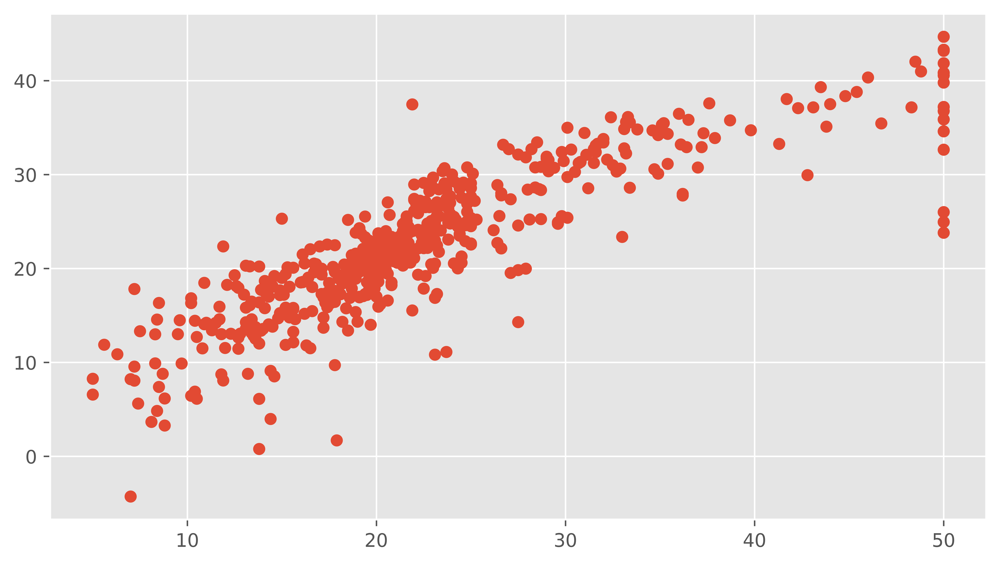

In [58]:
plt.scatter(bos['PRICE'],Y_pred)

In [64]:
boston

{'DESCR': "Boston House Prices dataset\n===========================\n\nNotes\n------\nData Set Characteristics:  \n\n    :Number of Instances: 506 \n\n    :Number of Attributes: 13 numeric/categorical predictive\n    \n    :Median Value (attribute 14) is usually the target\n\n    :Attribute Information (in order):\n        - CRIM     per capita crime rate by town\n        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.\n        - INDUS    proportion of non-retail business acres per town\n        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)\n        - NOX      nitric oxides concentration (parts per 10 million)\n        - RM       average number of rooms per dwelling\n        - AGE      proportion of owner-occupied units built prior to 1940\n        - DIS      weighted distances to five Boston employment centres\n        - RAD      index of accessibility to radial highways\n        - TAX      full-value property-tax rate per

In [71]:

import skimage
random_image = nr.random((500,500))

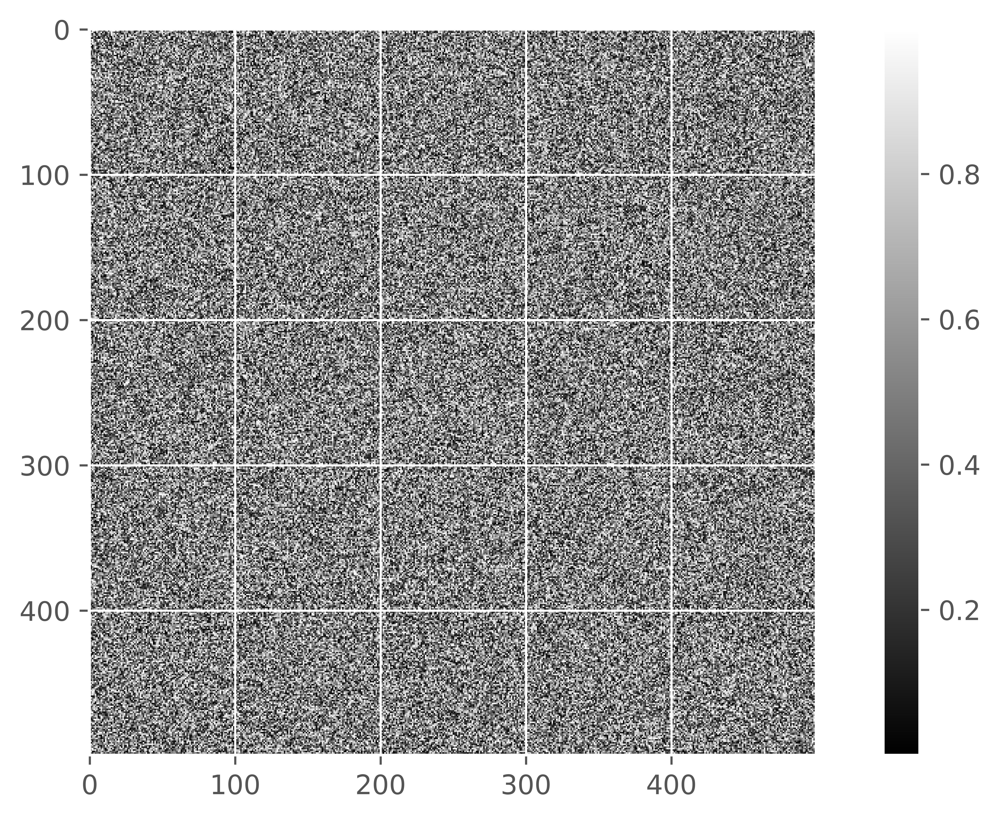

In [82]:
plt.imshow(random_image,cmap='gray')
plt.colorbar()

In [76]:
from skimage import data
coins = data.coins()


In [78]:
print('Type: ',type(coins))
print(coins.dtype,coins.shape)

Type:  <class 'numpy.ndarray'>
uint8 (303, 384)


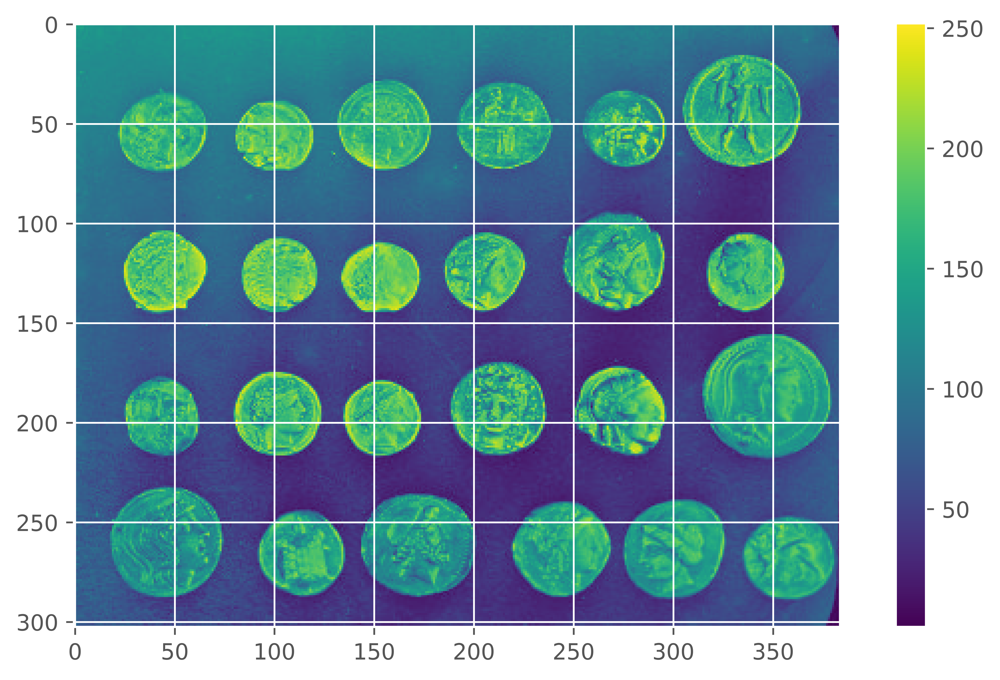

In [81]:
plt.imshow(coins)
plt.colorbar()

In [83]:
cat = data.chelsea()
print(cat.shape)
print(cat.min(),cat.max())
print(cat.dtype)

(300, 451, 3)
0 231
uint8


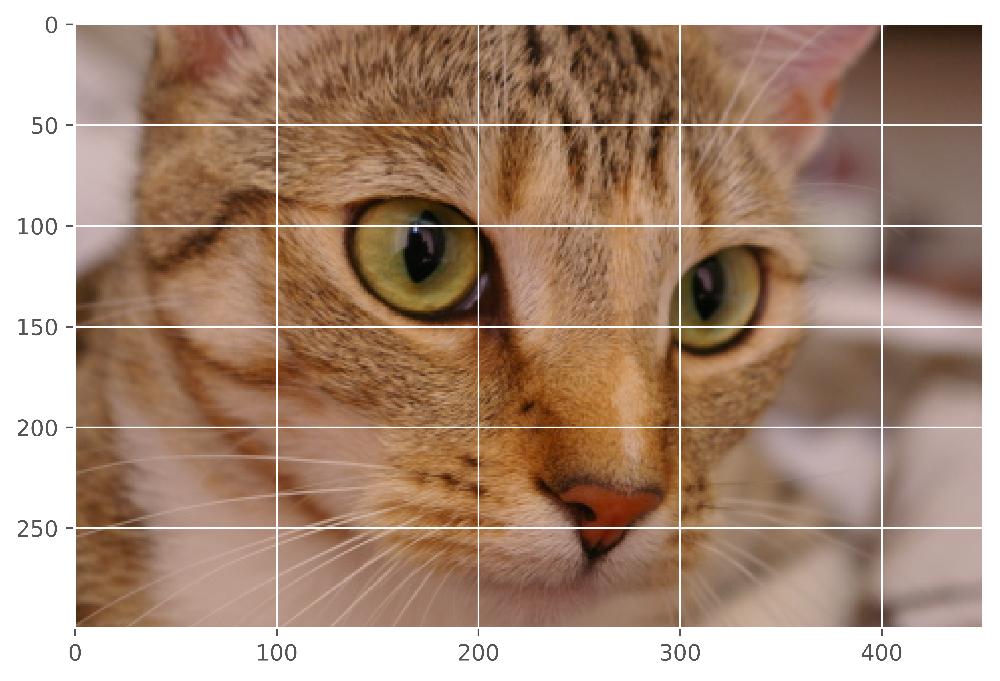

In [84]:
plt.imshow(cat)

In [85]:
red_cat = cat[:,:,0]/255.0

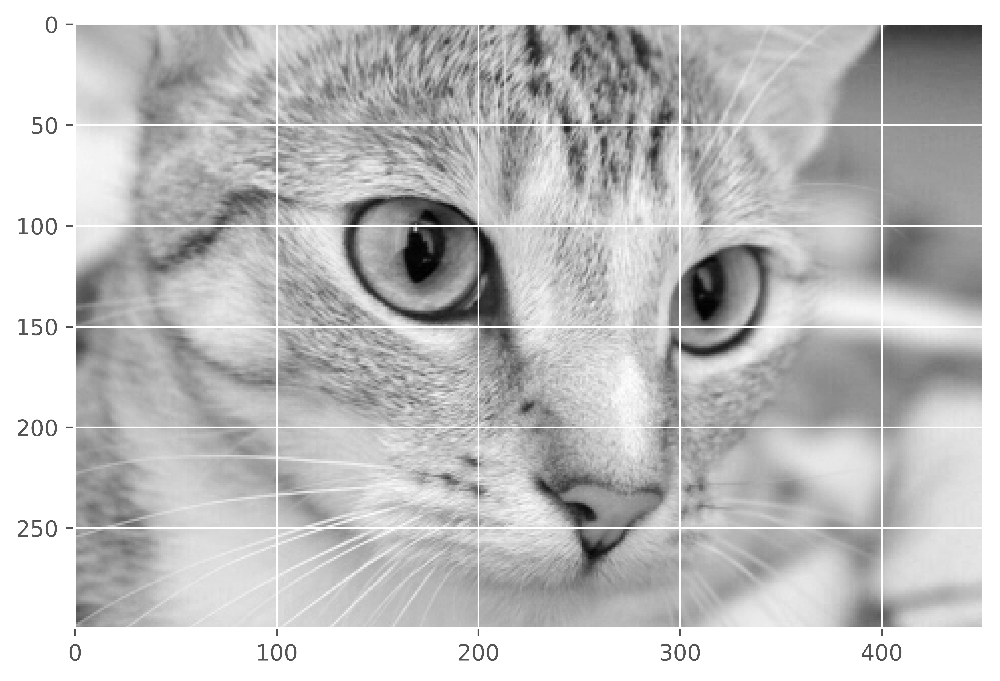

In [87]:
plt.imshow(red_cat, cmap='gray')

In [93]:
red_cat_sz =red_cat.shape
noise = nr.random(red_cat_sz)*0.6

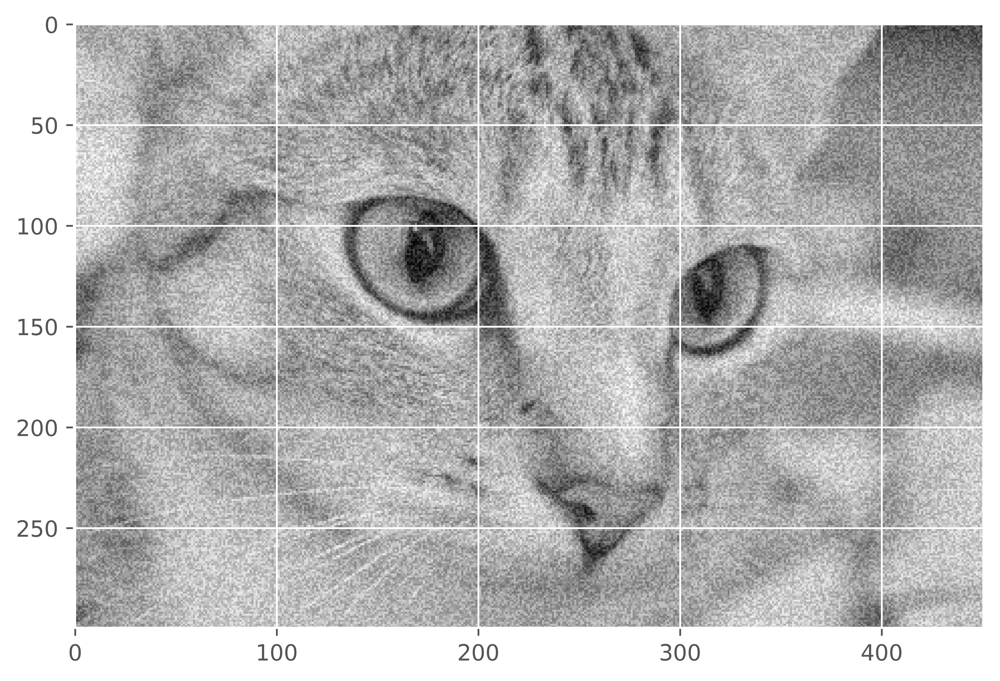

In [90]:
plt.imshow(red_cat + noise,cmap='gray')

In [91]:
(red_cat+noise).max()

1.1248608903956616

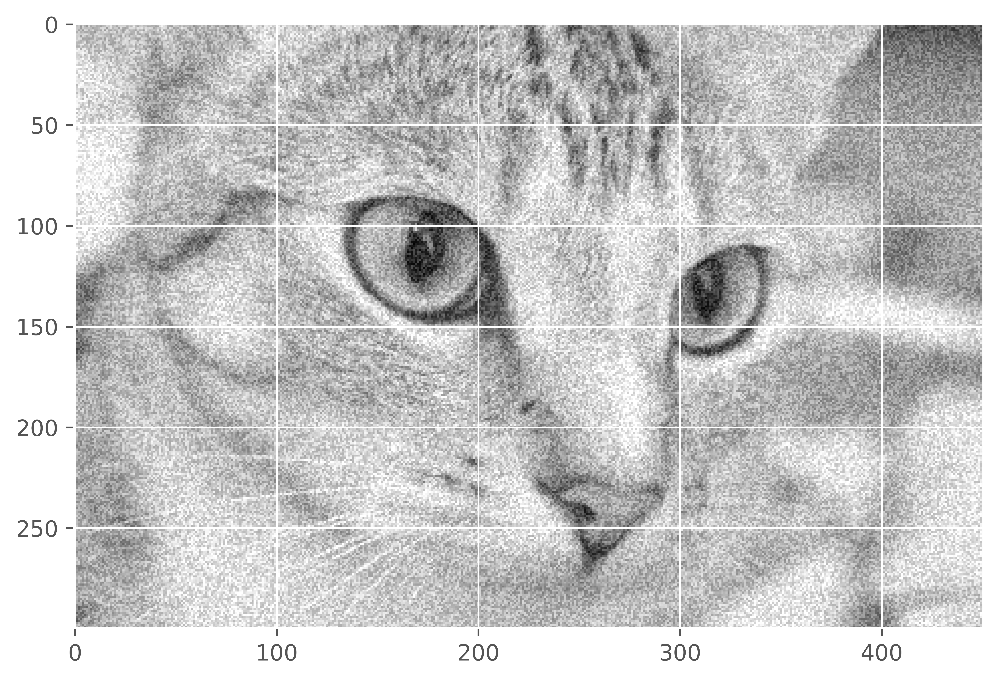

In [92]:
plt.imshow(red_cat + noise,cmap='gray',vmax=1, vmin=0)

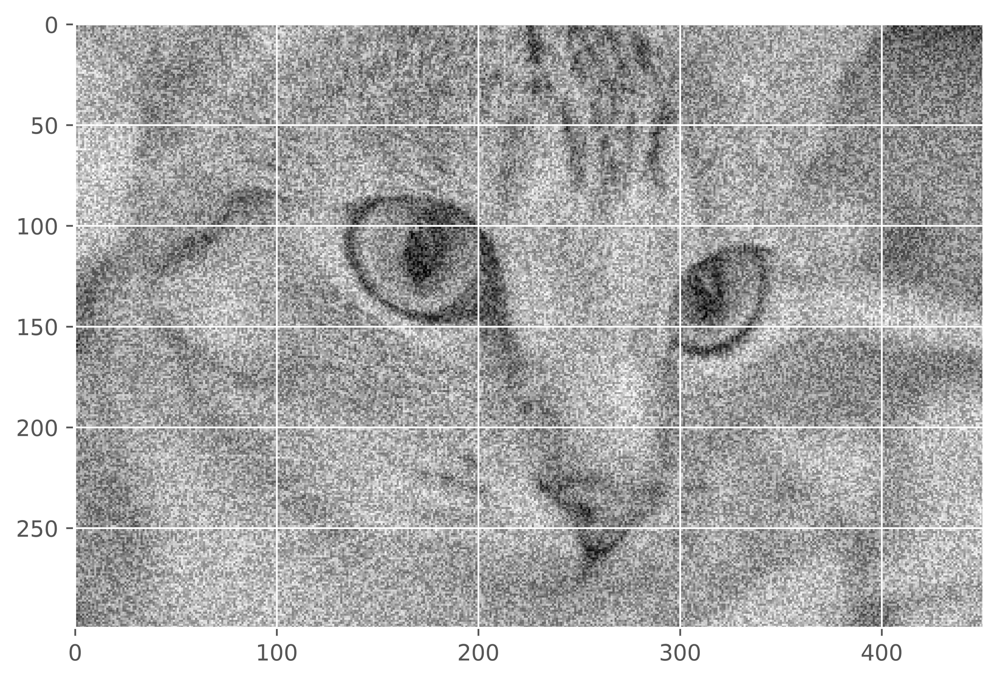

In [94]:
plt.imshow(red_cat + noise,cmap='gray')

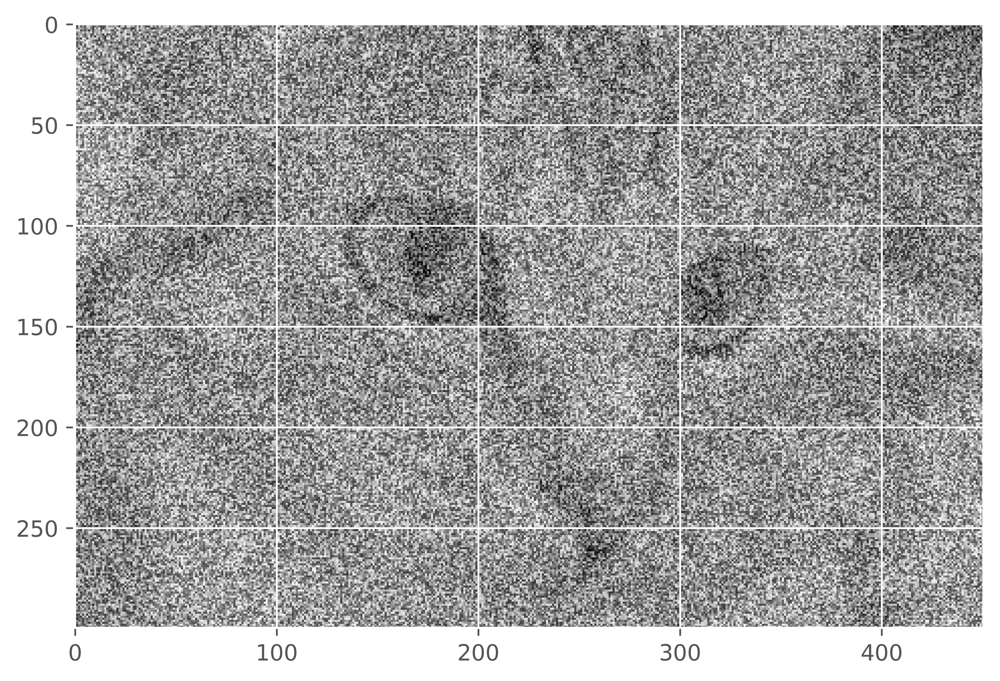

In [95]:
plt.imshow(red_cat + noise*3,cmap='gray')